<a href="https://colab.research.google.com/github/Maryam-Mostafa/Distracted-drivers-classification/blob/master/distracted_driver_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
import os
import cv2
import gc
import random
import numpy as np
import pandas as pd
from PIL import Image
from glob import glob
from getpass import getpass
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
from keras.layers import Input
from keras import models
from keras import layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from dask.array.image import imread
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model, to_categorical
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense,GlobalAveragePooling2D
from keras.layers import Flatten,Dropout
from keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras import optimizers
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.imagenet_utils import preprocess_input


# Load Dataset

In [ ]:
user = 'maryammostafa'
key = '401b328964d25dfe217fe607116c36f7'

if '.kaggle' not in os.listdir('/root'):
    !mkdir ~/.kaggle
!touch /root/.kaggle/kaggle.json
!chmod 666 /root/.kaggle/kaggle.json
with open('/root/.kaggle/kaggle.json', 'w') as f:
    f.write('{"username":"%s","key":"%s"}' % (user, key))
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c state-farm-distracted-driver-detection

100% 4.00G/4.00G [03:16<00:00, 22.6MB/s]
100% 4.00G/4.00G [03:16<00:00, 21.8MB/s]


In [ ]:
!chmod 777 *

In [ ]:
!unzip state-farm-distracted-driver-detection.zip

Streaming output truncated to the last 5000 lines.
  inflating: imgs/train/c7/img_56636.jpg  
  inflating: imgs/train/c7/img_56661.jpg  
  inflating: imgs/train/c7/img_56699.jpg  
  inflating: imgs/train/c7/img_56717.jpg  
  inflating: imgs/train/c7/img_56724.jpg  
  inflating: imgs/train/c7/img_56768.jpg  
  inflating: imgs/train/c7/img_56779.jpg  
  inflating: imgs/train/c7/img_56849.jpg  
  inflating: imgs/train/c7/img_56899.jpg  
  inflating: imgs/train/c7/img_56938.jpg  
  inflating: imgs/train/c7/img_5706.jpg  
  inflating: imgs/train/c7/img_57076.jpg  
  inflating: imgs/train/c7/img_57122.jpg  
  inflating: imgs/train/c7/img_57137.jpg  
  inflating: imgs/train/c7/img_5715.jpg  
  inflating: imgs/train/c7/img_57278.jpg  
  inflating: imgs/train/c7/img_57321.jpg  
  inflating: imgs/train/c7/img_57345.jpg  
  inflating: imgs/train/c7/img_57355.jpg  
  inflating: imgs/train/c7/img_5741.jpg  
  inflating: imgs/train/c7/img_57433.jpg  
  inflating: imgs/train/c7/img_5753.jpg  
  infla

In [ ]:
# paths setup
train_directory = '/content/imgs/train'
test_directory =  '/content/imgs/test'
random_test = '/content/imgs'
driver_imgs_list = pd.read_csv('driver_imgs_list.csv')

# Visualize Images

In [ ]:
driver_imgs_list.sample(5)

,subject,classname,img
20306,p066,c8,img_64193.jpg
14276,p049,c7,img_1677.jpg
8178,p026,c0,img_12114.jpg
21067,p075,c3,img_40140.jpg
1915,p014,c3,img_97080.jpg


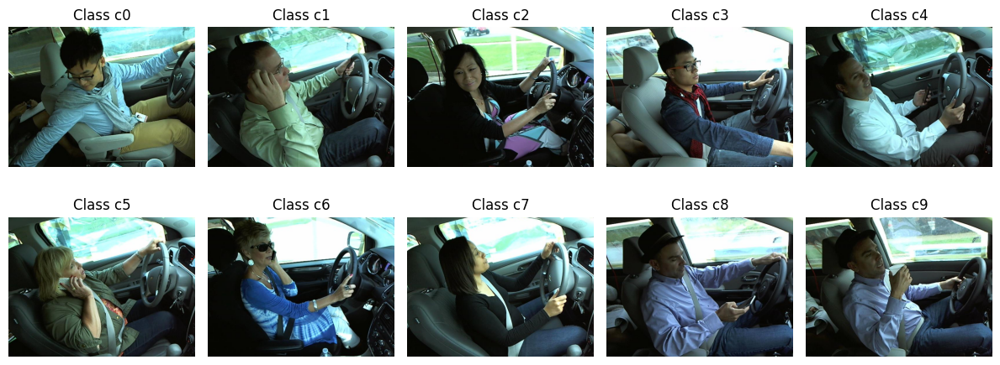

In [ ]:
import glob
class_folders = glob.glob(train_directory + "/c*/")
rows, cols = 2, 5
fig, axes = plt.subplots(rows, cols, figsize=(12, 5))

for i, class_folder in enumerate(class_folders):
    image_files = glob.glob(class_folder + "*.jpg")
    class_name = f'c{i}'

    row = i // cols
    col = i % cols

    image = plt.imread(image_files[0])
    axes[row, col].imshow(image)
    axes[row, col].axis("off")
    axes[row, col].set_title(f"Class {class_name}")

plt.tight_layout()
plt.show()

In [ ]:
# Defines
classes = ['c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']

class_description = {
'c0': 'safe driving',
'c1': 'texting - right',
'c2': 'talking on the phone - right',
'c3': 'texting - left',
'c4': 'talking on the phone - left',
'c5': 'operating the radio',
'c6': 'drinking',
'c7': 'reaching behind',
'c8': 'hair and makeup',
'c9': 'talking to passenger'}

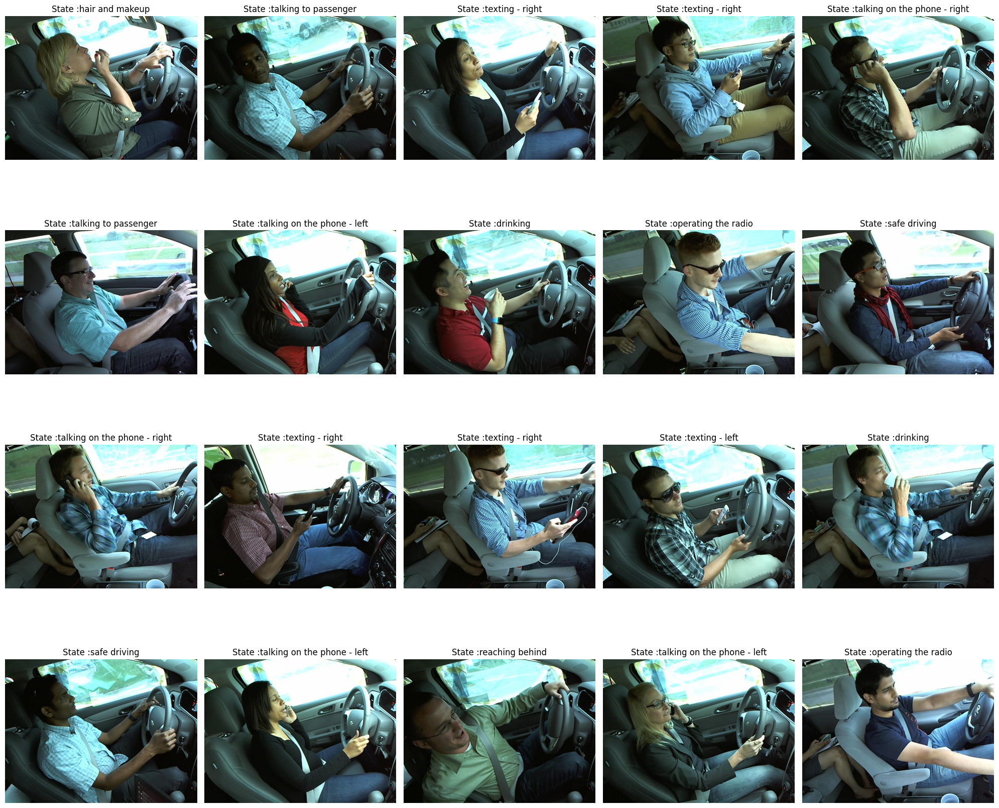

In [ ]:
# Draw sample of images
fig = plt.figure(figsize=(20,18))
cols,rows = 5,4
for i in range(1,cols*rows+1):
    pic_indx = random.randint(0,driver_imgs_list.shape[0])
    img = Image.open(os.path.join('/content/'+'imgs/train/')+str(driver_imgs_list.loc[pic_indx,'classname']+'/')
                    + str(driver_imgs_list.loc[pic_indx,'img']))
    fig.add_subplot(rows,cols,i)
    plt.imshow(img)
    plt.title('State :'+ class_description[driver_imgs_list.loc[pic_indx,'classname']])
    plt.axis('off')

plt.tight_layout()
plt.show()

- number of images per class

In [ ]:
import plotly.express as px
px.histogram(driver_imgs_list, x="classname", color="classname", title="Number of images by categories ")

# Preprocessing

In [ ]:
# get size of image
img = Image.open('/content/imgs/test/img_1.jpg')
print(img.size) #-- will resize to 240

(640, 480)


In [ ]:
def create_training_data(train_directory,classes, size):
  training_data = []
  i = 0
  for category in classes:
      path = os.path.join(train_directory,category)
      class_num = classes.index(category)
      for img in os.listdir(path):
          img_array = cv2.imread(os.path.join(path,img),cv2.IMREAD_GRAYSCALE)
          new_img = cv2.resize(img_array,(size,size))
          training_data.append([ new_img,class_num])
  return training_data

In [ ]:
def create_testing_data(test_directory,classes,size):
  testing_data = []
  i = 0
  for img in os.listdir(test_directory):
      img_array = cv2.imread(os.path.join(test_directory,img),cv2.IMREAD_GRAYSCALE)
      new_img = cv2.resize(img_array,(size,size))
      testing_data.append([img,new_img])
  return testing_data

In [ ]:
training_data= create_training_data(train_directory,classes, 240)
testing_data= create_testing_data(test_directory,classes, 240)

**Split data to train & validation**

In [ ]:
def shuffle_data(training_data):
  random.shuffle(training_data)
  x,y= [],[]
  for features, label in training_data:
      x.append(features)
      y.append(label)
  return x,y

In [ ]:
x,y = shuffle_data(training_data)

In [ ]:
x_train,x_valid,y_train,y_valid = train_test_split(np.array(x).reshape(-1,240,240,1),y,test_size=0.3,random_state=50)

In [ ]:
Y_train =to_categorical(y_train,num_classes=10)
Y_valid =to_categorical(y_valid,num_classes=10)

In [ ]:
# clearing the ram for preventing colab crash
del(x)
del(y_train)
del(y_valid)
del(y)
del(driver_imgs_list)
del(training_data)

In [ ]:
gc.collect()

60

# Data Augmentation

In [ ]:
train_datagen = ImageDataGenerator(rescale=1.0/255,
                                  rotation_range=40,
                                  zoom_range=0.2,
                                  horizontal_flip=True,
                                  fill_mode='nearest',
                                  validation_split = 0.3
                                   )
test_datagen = ImageDataGenerator(rescale=1.0/ 255, validation_split = 0.3)

In [ ]:
batch_size = 8
training_generator = train_datagen.flow(x_train, Y_train, batch_size = batch_size)
validation_generator = test_datagen.flow(x_valid, Y_valid, batch_size = batch_size)

In [ ]:
def plot_datagen(datagen, test_files, color_type=1):
    test_file = test_files[np.random.randint(0, len(test_files))]
    img_brute = cv2.imread(test_file, cv2.IMREAD_GRAYSCALE)
    img_brute = cv2.resize(img_brute,(240,240))
    new_img = img_brute.reshape(-1,240,240,color_type)

    i = 0
    for batch in datagen.flow(new_img, batch_size=1):
      plt.figure(i + 1)
      imgplot = plt.imshow(image.array_to_img(batch[0]), cmap='gray')
      i += 1
      if i % 4 == 0:break

    plt.show()

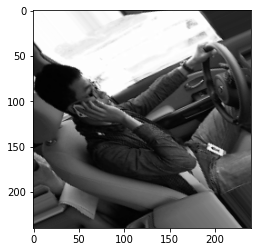

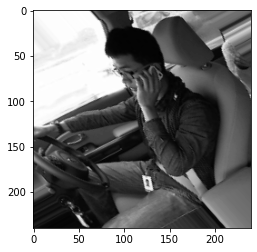

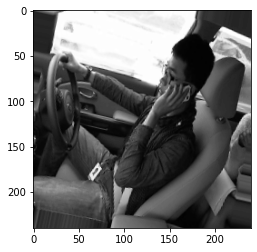

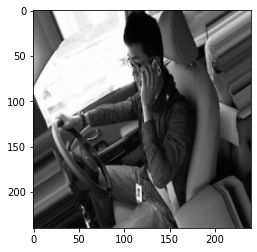

In [ ]:
classed = np.random.randint(0, 10)
test_files = glob(os.path.join(f'/content/imgs/train/c{classed}', '*.jpg'))
plot_datagen(train_datagen, test_files)

In [ ]:
print(training_generator.x.shape)
print(training_generator.y.shape)

(15696, 240, 240, 1)
(15696, 10)


# Baseline CNN model

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32,kernel_size=(3,3),activation='relu',input_shape=(240,240,1)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(32,kernel_size=(3,3),activation='relu',padding='same'))
model.add(layers.BatchNormalization(axis = 3))
model.add(layers.MaxPooling2D(pool_size=(2,2),padding='same'))
model.add(layers.Dropout(0.3))
model.add(layers.Conv2D(64,kernel_size=(3,3),activation='relu',padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(64,kernel_size=(3,3),activation='relu',padding='same'))
model.add(layers.BatchNormalization(axis = 3))
model.add(layers.MaxPooling2D(pool_size=(2,2),padding='same'))
model.add(layers.Dropout(0.3))
model.add(layers.Conv2D(128,kernel_size=(3,3),activation='relu',padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(128,kernel_size=(3,3),activation='relu',padding='same'))
model.add(layers.BatchNormalization(axis = 3))
model.add(layers.MaxPooling2D(pool_size=(2,2),padding='same'))
model.add(layers.Dropout(0.5))
model.add(layers.Flatten())
model.add(layers.Dense(units = 512,activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(units = 128,activation='relu'))
model.add(layers.Dropout(0.25))
model.add(layers.Dense(10,activation='softmax'))

In [ ]:
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [ ]:
results = model.fit(x_train,Y_train,batch_size=64,epochs=10 ,callbacks=[keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=4,)],validation_data=(x_valid,Y_valid))

Epoch 1/10
246/246 [==============================] - 162s 632ms/step - loss: 0.8729 - accuracy: 0.7282 - val_loss: 0.1872 - val_accuracy: 0.9410
Epoch 2/10
246/246 [==============================] - 154s 627ms/step - loss: 0.1635 - accuracy: 0.9504 - val_loss: 0.1330 - val_accuracy: 0.9563
Epoch 3/10
246/246 [==============================] - 153s 621ms/step - loss: 0.0812 - accuracy: 0.9739 - val_loss: 0.0491 - val_accuracy: 0.9838
Epoch 4/10
246/246 [==============================] - 154s 626ms/step - loss: 0.0542 - accuracy: 0.9822 - val_loss: 0.0289 - val_accuracy: 0.9912
Epoch 5/10
246/246 [==============================] - 154s 626ms/step - loss: 0.0469 - accuracy: 0.9848 - val_loss: 0.0877 - val_accuracy: 0.9796
Epoch 6/10
246/246 [==============================] - 154s 626ms/step - loss: 0.0388 - accuracy: 0.9877 - val_loss: 0.0308 - val_accuracy: 0.9921
Epoch 7/10
246/246 [==============================] - 154s 626ms/step - loss: 0.0375 - accuracy: 0.9869 - val_loss: 0.0666 -

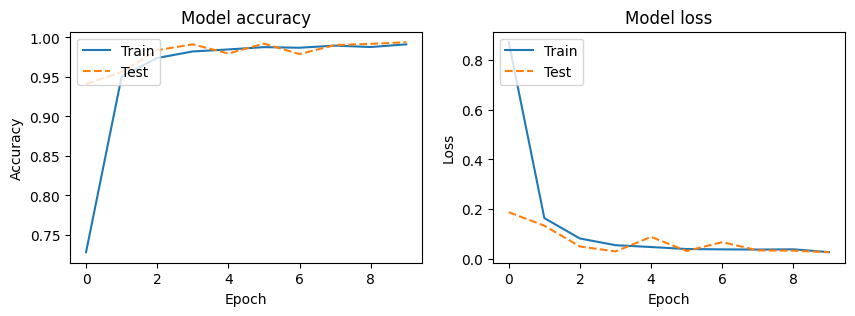

In [ ]:
plot_history(results, "Baseline CNN model")

In [ ]:
model.save('/content/drive/MyDrive/DeepLearningProject/SavedModels/BaseLine_CNN.h5')





# Baseline cnn with augmentation




In [ ]:
results_aug = model.fit_generator(training_generator,validation_data = validation_generator,callbacks=[keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=4,)], epochs= 40)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/40
246/246 [==============================] - 126s 445ms/step - loss: 2.3311 - accuracy: 0.2179 - val_loss: 4.3588 - val_accuracy: 0.1298
Epoch 2/40
246/246 [==============================] - 105s 425ms/step - loss: 1.6945 - accuracy: 0.4075 - val_loss: 4.6128 - val_accuracy: 0.1714
Epoch 3/40
246/246 [==============================] - 107s 432ms/step - loss: 1.3395 - accuracy: 0.5335 - val_loss: 0.8040 - val_accuracy: 0.7316
Epoch 4/40
246/246 [==============================] - 109s 442ms/step - loss: 1.0609 - accuracy: 0.6330 - val_loss: 0.6143 - val_accuracy: 0.8075
Epoch 5/40
246/246 [==============================] - 108s 438ms/step - loss: 0.8726 - accuracy: 0.6980 - val_loss: 0.4595 - val_accuracy: 0.8604
Epoch 6/40
246/246 [==============================] - 106s 429ms/step - loss: 0.7279 - accuracy: 0.7486 - val_loss: 1.2050 - val_accuracy: 0.6229
Epoch 7/40
246/246 [==============================] - 106s 430ms/step - loss: 0.6605 - accuracy: 0.7753 - val_loss: 0.4738 -

In [ ]:
# plot_history(results_aug, "CNN model with augmentation")

In [ ]:
model.save('/content/drive/MyDrive/DeepLearningProject/SavedModels/aug_CNN_model.h5')

In [ ]:
del training_generator, validation_generator

# Transfer Learning

In [ ]:
training_data= create_training_data(train_directory,classes,200)
x,y = shuffle_data(training_data)
X = x.reshape(-1, 200, 200, 3)

In [ ]:
inputs = Input(shape = (200, 200, 3), name = 'Image_input')
conv_base = VGG19(weights='imagenet', include_top=False, input_shape= (200,200,3))
conv_base.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 200, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 200, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 100, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 100, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 100, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 50, 128)       0     

In [ ]:
# Freeze base model
conv_base.trainable = False

In [ ]:
x = conv_base(inputs, training=False)

# Add the fully-connected layers
x = GlobalAveragePooling2D()(x)
x = Dense(1024,activation='relu')(x)
x = Dropout(0.1)(x)
x = Dense(1024,activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(512,activation='relu')(x)
outputs = Dense(10, activation='softmax', name='predictions')(x)

# Combine inputs and outputs to create model
model = keras.Model(inputs, outputs)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Image_input (InputLayer)    [(None, 200, 200, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, 6, 6, 512)         20024384  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1024)              525312    
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 1024)              1049600   
                                                             

In [ ]:
# compile CNN model
model.compile(loss=keras.losses.CategoricalCrossentropy(from_logits=True),optimizer = optimizers.RMSprop(lr=2e-5) , metrics=[keras.metrics.CategoricalAccuracy()])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
history = model.fit(x_train, Y_train,epochs=30, batch_size=64,callbacks=[keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=4,)],validation_data=(x_valid, Y_valid))

Epoch 1/30


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


123/123 [==============================] - 132s 920ms/step - loss: 2.7034 - categorical_accuracy: 0.1813 - val_loss: 1.6171 - val_categorical_accuracy: 0.4784
Epoch 2/30
123/123 [==============================] - 106s 863ms/step - loss: 1.7479 - categorical_accuracy: 0.4020 - val_loss: 1.0142 - val_categorical_accuracy: 0.7476
Epoch 3/30
123/123 [==============================] - 106s 867ms/step - loss: 1.2804 - categorical_accuracy: 0.5650 - val_loss: 0.7009 - val_categorical_accuracy: 0.8435
Epoch 4/30
123/123 [==============================] - 106s 867ms/step - loss: 0.9690 - categorical_accuracy: 0.6841 - val_loss: 0.5048 - val_categorical_accuracy: 0.8924
Epoch 5/30
123/123 [==============================] - 106s 868ms/step - loss: 0.7555 - categorical_accuracy: 0.7589 - val_loss: 0.3830 - val_categorical_accuracy: 0.9174
Epoch 6/30
123/123 [==============================] - 106s 867ms/step - loss: 0.5998 - categorical_accuracy: 0.8141 - val_loss: 0.3023 - val_categorical_accuracy

In [ ]:
plot_history(history, "transfer learning using VGG16 model")

In [ ]:
model.save('/content/drive/MyDrive/DeepLearningProject/SavedModels/TL_model.h5')

# Transfer Learning with Augmentation

In [ ]:
datagen = ImageDataGenerator(rescale=1.0/255,
                                  rotation_range=40,
                                  zoom_range=0.2,
                                  horizontal_flip=True,

                                  fill_mode='nearest',
                                  validation_split = 0.3)
image_size=(240,240)
batch_size = 128
test_datagen = ImageDataGenerator(rescale=1.0/ 255, validation_split = 0.3)

training_generator = datagen.flow_from_directory(train_directory,class_mode='categorical',target_size=image_size,subset='training', batch_size = batch_size)

validation_generator = test_datagen.flow_from_directory(train_directory,class_mode='categorical',target_size=image_size,subset='validation', batch_size = batch_size)

In [ ]:
inputs = Input(shape = (240, 240, 3), name = 'Image_input')
conv_base = VGG19(weights='imagenet', include_top=False, input_shape= (240,240,3))
conv_base.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 240, 240, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 240, 240, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 120, 120, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 120, 120, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 120, 120, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 60, 60, 128)       0     

In [ ]:
# Freeze base model
conv_base.trainable = False

In [ ]:
x = conv_base(inputs, training=False)

# Add the fully-connected layers
x = GlobalAveragePooling2D()(x)
x = Dense(1024,activation='relu')(x)
x = Dropout(0.1)(x)
x = Dense(1024,activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(512,activation='relu')(x)
outputs = Dense(10, activation='softmax', name='predictions')(x)

# Combine inputs and outputs to create model
model = keras.Model(inputs, outputs)

model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Image_input (InputLayer)    [(None, 240, 240, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_3 (Dense)             (None, 1024)              525312    
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 dense_4 (Dense)             (None, 1024)              1049600   
                                                           

In [ ]:
# compile CNN model
es_callback = keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=4,)
model.compile(loss=keras.losses.CategoricalCrossentropy(from_logits=True),optimizer = optimizers.RMSprop(lr=2e-5) ,callbacks=[es_callback], metrics=[keras.metrics.CategoricalAccuracy()])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
results_aug_with_TL = model.fit_generator(training_generator,validation_data = validation_generator,callbacks=[keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=4,)], epochs= 30)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/30


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


123/123 [==============================] - 340s 3s/step - loss: 2.6974 - categorical_accuracy: 0.1127 - val_loss: 2.2813 - val_categorical_accuracy: 0.1633
Epoch 2/30
123/123 [==============================] - 314s 3s/step - loss: 2.5140 - categorical_accuracy: 0.1314 - val_loss: 2.2304 - val_categorical_accuracy: 0.2977
Epoch 3/30
123/123 [==============================] - 312s 3s/step - loss: 2.4136 - categorical_accuracy: 0.1500 - val_loss: 2.1483 - val_categorical_accuracy: 0.3431
Epoch 4/30
123/123 [==============================] - 314s 3s/step - loss: 2.3300 - categorical_accuracy: 0.1716 - val_loss: 2.0560 - val_categorical_accuracy: 0.3478
Epoch 5/30
123/123 [==============================] - 317s 3s/step - loss: 2.2671 - categorical_accuracy: 0.1939 - val_loss: 1.9615 - val_categorical_accuracy: 0.4063
Epoch 6/30
123/123 [==============================] - 317s 3s/step - loss: 2.2055 - categorical_accuracy: 0.2119 - val_loss: 1.8956 - val_categorical_accuracy: 0.4137
Epoch 7/3

In [ ]:
# plot_history(history, "transfer learning using VGG19 model with augmentation")

In [ ]:
model.save('/content/drive/MyDrive/DeepLearningProject/SavedModels/aug_and_TL_model.h5')

# Baseline Dense model

In [ ]:
training_data= create_training_data(train_directory,classes,240)
x,y = shuffle_data(training_data)

In [ ]:
x_train,x_valid,y_train,y_valid = train_test_split(np.array(x).reshape(-1,240*240*1),y,test_size=0.3,random_state=50)

In [ ]:
Y_train =to_categorical(y_train,num_classes=10)
Y_valid =to_categorical(y_valid,num_classes=10)

In [ ]:
x_train = x_train.astype('float32') / 255
x_valid = x_valid.astype('float32') / 255

In [ ]:
x_train.shape

(15696, 57600)

In [ ]:
Y_train.shape

(15696, 10)

In [ ]:
network = models.Sequential()
network.add(layers.Dense(512, activation='relu', name='Layer_1', input_shape=( 240*240*1,)))
network.add(layers.Dense(256, activation='relu', name='Layer_2'))
network.add(layers.Dense(128, activation='relu', name='Layer_3'))
network.add(layers.Dense(10, activation='softmax'))

In [ ]:
network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer_1 (Dense)             (None, 512)               29491712  
                                                                 
 Layer_2 (Dense)             (None, 256)               131328    
                                                                 
 Layer_3 (Dense)             (None, 128)               32896     
                                                                 
 dense (Dense)               (None, 10)                1290      
                                                                 
Total params: 29,657,226
Trainable params: 29,657,226
Non-trainable params: 0
_________________________________________________________________


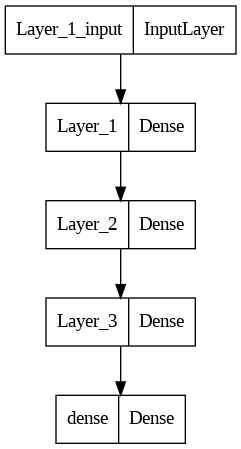

In [ ]:
plot_model(network)

In [ ]:
network.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
es_callback = keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=4,)

history = network.fit(x_train, Y_train, validation_data = (x_valid, Y_valid), batch_size=8,callbacks=[es_callback],epochs=10)

Epoch 1/10
1962/1962 [==============================] - 25s 9ms/step - loss: 154.2257 - accuracy: 0.2998 - val_loss: 7.9297 - val_accuracy: 0.3126
Epoch 2/10
1962/1962 [==============================] - 17s 9ms/step - loss: 2.9491 - accuracy: 0.4542 - val_loss: 1.5032 - val_accuracy: 0.5095
Epoch 3/10
1962/1962 [==============================] - 18s 9ms/step - loss: 1.9322 - accuracy: 0.4150 - val_loss: 2.3039 - val_accuracy: 0.1006
Epoch 4/10
1962/1962 [==============================] - 18s 9ms/step - loss: 2.3010 - accuracy: 0.1065 - val_loss: 2.3005 - val_accuracy: 0.1130
Epoch 5/10
1962/1962 [==============================] - 17s 9ms/step - loss: 2.3001 - accuracy: 0.1102 - val_loss: 2.3004 - val_accuracy: 0.1130
Epoch 6/10
1962/1962 [==============================] - 18s 9ms/step - loss: 2.3000 - accuracy: 0.1102 - val_loss: 2.3005 - val_accuracy: 0.1130


Exception ignored in: <function _xla_gc_callback at 0x7fed9742bb50>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 103, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


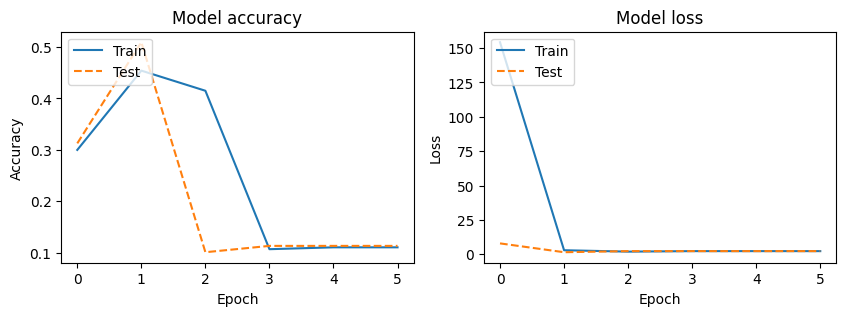

In [ ]:
plot_history(history, "Baseline dense model")

In [ ]:
model.save('/content/drive/MyDrive/DeepLearning Project/SavedModels/base_dense_model.h5')

* **Trial for having aug with dense**





In [ ]:
#clearing the ram for preventing colab crash
del x,y_train,y_valid,y,X

In [ ]:
batch_size = 64
training_generator = train_datagen.flow(x_train, Y_train, batch_size = batch_size)
validation_generator = test_datagen.flow(x_valid, Y_valid, batch_size = batch_size)

In [ ]:
x_train = training_generator.x.reshape(-1,240*240*1)
Y_train = training_generator.y

x_valid = validation_generator.x.reshape(-1,240*240*1)
Y_valid = validation_generator.y

# del(x_train)
# del(Y_train)
# del(x_valid)
# del(Y_valid)
# gc.collect()

In [ ]:
del training_generator
del validation_generator
gc.collect()

627

In [ ]:
# datagen = ImageDataGenerator(rescale=1.0/255,
#                                   rotation_range=40,
#                                   zoom_range=0.2,
#                                   horizontal_flip=True,
#                                   fill_mode='nearest',
#                                   validation_split = 0.3)
# image_size=(240,240)
# batch_size = 32

# training_generator = datagen.flow_from_directory(train_directory,class_mode='categorical',target_size=image_size,subset='training', batch_size = batch_size)
# training_generator = datagen.flow_from_directory(train_directory,class_mode='categorical',target_size=image_size,subset='validation', batch_size = batch_size)

In [ ]:
x_train,x_valid,y_train,y_valid = train_test_split(np.array(x).reshape(-1,240,240,1),y,test_size=0.3,random_state=50)

In [ ]:
Y_train =to_categorical(y_train,num_classes=10)
Y_valid =to_categorical(y_valid,num_classes=10)

In [ ]:
test_datagen = ImageDataGenerator(rescale=1.0/ 255, validation_split = 0.2)

In [ ]:
Y_valid.shape

(6728, 10)

In [ ]:
Y_train.shape

(15696, 10)

In [ ]:
del(features)
gc.collect()

360

In [ ]:
from keras import models
from keras import layers

network = models.Sequential()
network.add(layers.Dense(256, activation='relu', name='Layer_1', input_shape=( 240*240*1,)))
network.add(layers.Dense(10, activation='softmax'))

In [ ]:
# Freeze base model
network.trainable = True

In [ ]:
network.summary()

In [ ]:
from tensorflow.keras.optimizers import Adam
network.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])


In [ ]:
history = network.fit(x_train, Y_train, validation_data = (x_valid, Y_valid), epochs=40, batch_size=64)

Epoch 1/40
246/246 [==============================] - 9s 27ms/step - loss: 802.1790 - accuracy: 0.1228 - val_loss: 2.3021 - val_accuracy: 0.1097
Epoch 2/40
246/246 [==============================] - 4s 15ms/step - loss: 2.3016 - accuracy: 0.1116 - val_loss: 2.3013 - val_accuracy: 0.1097
Epoch 3/40
246/246 [==============================] - 4s 15ms/step - loss: 2.3008 - accuracy: 0.1116 - val_loss: 2.3006 - val_accuracy: 0.1097
Epoch 4/40
246/246 [==============================] - 4s 15ms/step - loss: 2.3004 - accuracy: 0.1116 - val_loss: 2.3002 - val_accuracy: 0.1097
Epoch 5/40
246/246 [==============================] - 4s 17ms/step - loss: 2.3001 - accuracy: 0.1116 - val_loss: 2.3001 - val_accuracy: 0.1097
Epoch 6/40
246/246 [==============================] - 4s 15ms/step - loss: 2.3000 - accuracy: 0.1116 - val_loss: 2.3000 - val_accuracy: 0.1097
Epoch 7/40
246/246 [==============================] - 4s 15ms/step - loss: 2.2999 - accuracy: 0.1116 - val_loss: 2.2999 - val_accuracy: 0.10

#CNN Visualization

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/DeepLearningProject/SavedModels/project_model.h5')

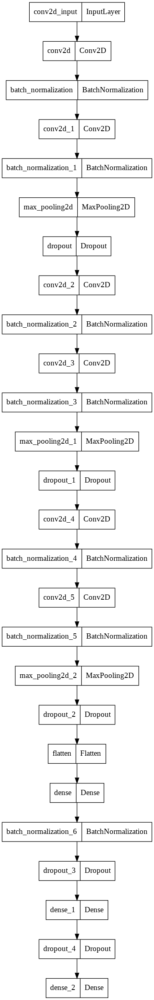

In [ ]:
plot_model(model)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 238, 238, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 238, 238, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 238, 238, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 238, 238, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 119, 119, 32)     0         
 )                                                               
                                                        

In [ ]:
!wget https://miro.medium.com/max/640/1*SGcYTTbffuyhWx6XYz7fkA.jpeg

--2022-07-07 08:58:11--  https://miro.medium.com/max/640/1*SGcYTTbffuyhWx6XYz7fkA.jpeg
Resolving miro.medium.com (miro.medium.com)... 162.159.153.4, 162.159.152.4, 2606:4700:7::a29f:9804, ...
Connecting to miro.medium.com (miro.medium.com)|162.159.153.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 60126 (59K) [image/jpeg]
Saving to: ‘1*SGcYTTbffuyhWx6XYz7fkA.jpeg’

1*SGcYTTbffuyhWx6XY 100%[===================>]  58.72K  --.-KB/s    in 0.001s  

2022-07-07 08:58:11 (73.4 MB/s) - ‘1*SGcYTTbffuyhWx6XYz7fkA.jpeg’ saved [60126/60126]



In [ ]:
# preds = model.predict(x)
# print('Predicted:', decode_predictions(preds, top=3)[0])

In [ ]:
print(preds)

[[1.0000000e+00 2.0398418e-10 1.5266856e-12 3.9603688e-11 3.1596562e-11
  2.3834816e-12 9.0941743e-15 1.4851765e-13 4.0110398e-13 2.7564575e-08]]


In [ ]:
len(preds)


1

In [ ]:
first_layer_activation = preds[0]
print(first_layer_activation.shape)

(10,)


In [ ]:
# Sucess trial
# The local path to our target image
img_path = '/content/imgs/train/c0/img_100026.jpg'

In [ ]:
img_array = cv2.imread(img_path,cv2.IMREAD_GRAYSCALE)
new_img = cv2.resize(img_array,(240,240))
x = np.array(new_img).reshape(-1,240,240,1)
# X = np.array(x).reshape(240,240,1)
# x = image.img_to_array(img)
# img = image.load_img(img_path, target_size=(240, 240,1))
# x = image.img_to_array(img)
# x = np.expand_dims(x, axis=0)
# x = preprocess_input(x)

In [ ]:
x.shape

(1, 240, 240, 1)

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:10]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [ ]:
# preds = model.predict(x)
preds =0
# print('Predicted:', decode_predictions(preds, top=3)[0])

In [ ]:
activations = activation_model.predict(x)

In [ ]:
len(activations)

10

In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 238, 238, 32)


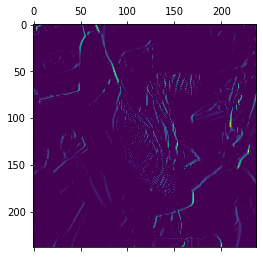

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 5], cmap='viridis')
plt.show()

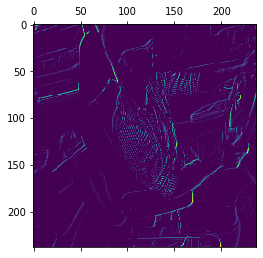

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 20], cmap='viridis')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide


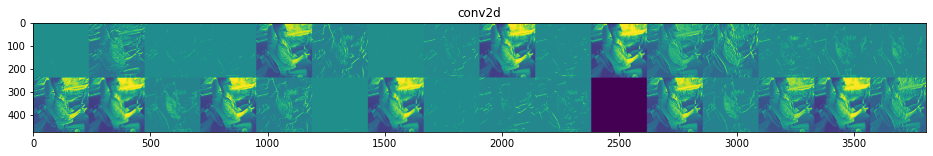

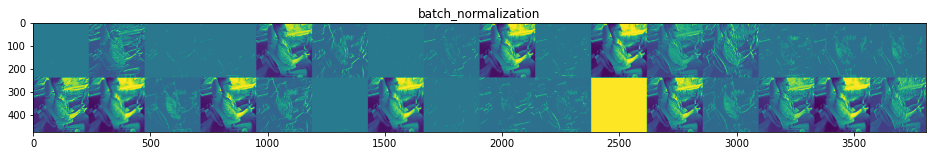

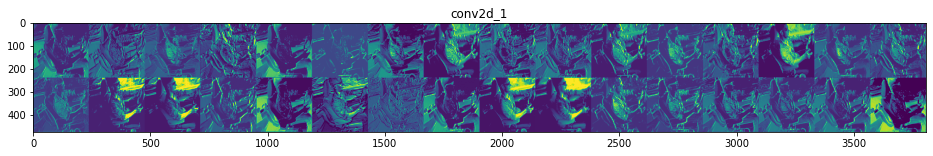

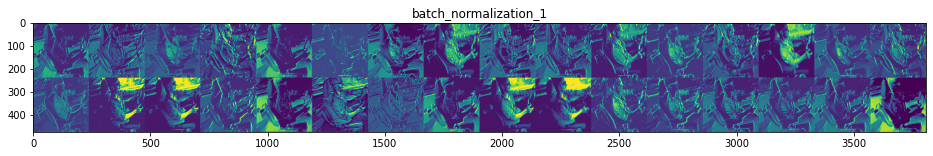

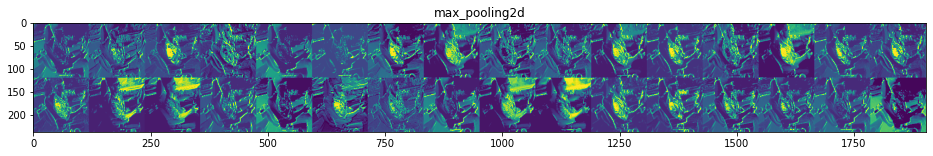

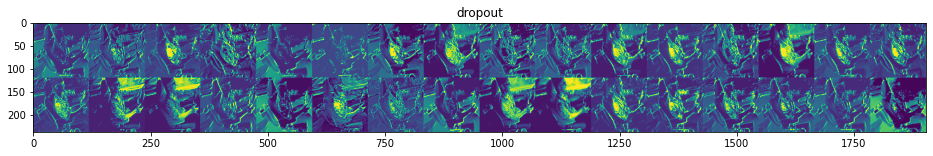

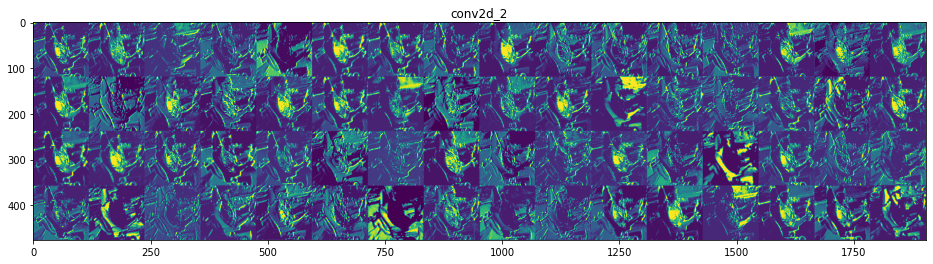

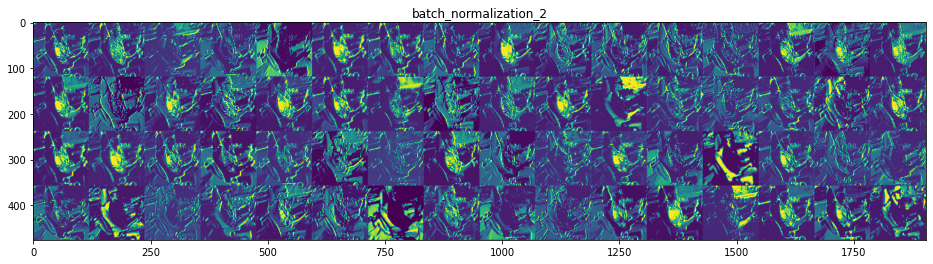

In [ ]:
import tensorflow.keras as keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

## Heat Map for Visual.

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/DeepLearningProject/SavedModels/project_model.h5')

In [ ]:
# Alternativly u can only show the effect of VGG by unlocking this code  >>>

# from tensorflow.keras.applications.vgg16 import VGG16
# import tensorflow.keras.backend as K

# K.clear_session()

# # Note that we are including the densely-connected classifier on top;
# # all previous times, we were discarding it.
# model = VGG16(weights='imagenet')

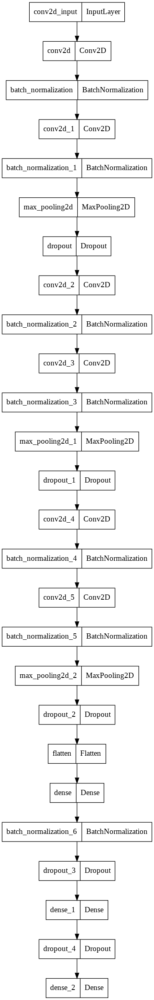

In [ ]:
plot_model(model)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 238, 238, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 238, 238, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 238, 238, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 238, 238, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 119, 119, 32)     0         
 )                                                               
                                                        

In [ ]:
# Sucess trial
# The local path to our target image
img_path = '/content/imgs/train/c0/img_100026.jpg'

In [ ]:

# We preprocess the image into a 4D tensor
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In [ ]:
img_array = cv2.imread(img_path,cv2.IMREAD_GRAYSCALE)
# new_img = cv2.resize(img_array,(224,224))
new_img = cv2.resize(img_array,(240,240))

In [ ]:
x = image.img_to_array(new_img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
# x = preprocess_input(x)
# x= x.reshape(-1,200,200,1)
x.shape

(1, 240, 240, 1)

In [ ]:
preds = model.predict(x)
# print('Predicted:', decode_predictions(preds, top=3))


/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [ ]:
np.argmax(preds)

0

In [ ]:
print(preds)

[[1.0000000e+00 2.0398418e-10 1.5266856e-12 3.9603688e-11 3.1596562e-11
  2.3834816e-12 9.0941743e-15 1.4851765e-13 4.0110398e-13 2.7564575e-08]]


In [ ]:
first_layer_activation = preds[0]
print(first_layer_activation.shape)

(10,)


In [ ]:
tf.compat.v1.enable_eager_execution()

In [ ]:
highest_output = model.output[:, 0]

# The is the output feature map of the `conv2d_4` layer,
# One of the midlle  convolutional layer in Our model
last_conv_layer = model.get_layer('conv2d_4')

# This is the gradient of the "Highest" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(highest_output, last_conv_layer.output)[0]

# This is a vector of shape (128,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `conv2d_4`,
# given a sample image
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two elephants
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the elephant class
for i in range(128):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

In [ ]:
heatmap.shape

(60, 60)

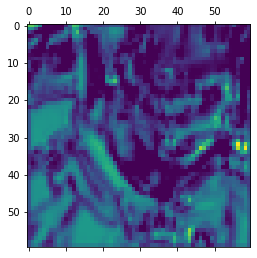

In [ ]:
import matplotlib.pyplot as plt
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [ ]:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('sample_image.jpg', superimposed_img)

True

In [ ]:
from pylab import  imshow
img_path = 'sample_image.jpg'


In [ ]:

# We preprocess the image into a 4D tensor
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


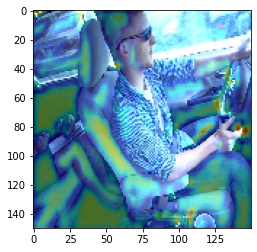

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

# Helping methods for plotting accuracy

In [ ]:
#plot helping method
def plot_history(history, title):
    plt.figure(figsize=(10,3))

    # Plot training & validation accuracy values
    plt.subplot(121)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'], linestyle='dashed')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')

    # Plot training & validation loss values
    plt.subplot(122)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'], linestyle='dashed')
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

In [ ]:
#Mount Drive
from google.colab import drive
drive.mount("/content/drive", force_remount=True)